# Car Sale Advertisements

## Table of Contents

1. [Problem Statement](#section1)<br>
   - 1.1 [Background Information](#section101)<br>
   - 1.2 [Plan of Action](#section102)<br>
2. [Loading Libraries](#section2)<br>
3. [Data Loading and Dataset Description](#section3)<br>
   - 3.1 [Data Loading](#section301)<br>
   - 3.2 [Dataset Information](#section302)<br>
   - 3.3 [Dataset Description](#section303)<br>
   - 3.4 [Data Cleaning](#section304)<br>
       - 3.4.1 [Null Values Treatement](#section305)<br>
       - 3.4.2 [Zero Data Identification & Handling](#section306)<br>
4. [Exploratory Data Analysis](#section4)<br>
    - 4.1 [Univariate Analysis](#section401)<br>
    - 4.2 [Bivariate Analysis](#section402)<br>
    - 4.3 [Feature Engineering](#section403)<br>
5. [Conclusion](#section5)<br>

<a id=section1></a>
### 1. Problem Statement

In this notebook, we will make use of some famous libraries used in R - dplyr, tidyverse, ggplot & vtree to perform data anlysis (EDA).

My goal during **EDA** is to develop an good understanding of the data. The easiest way to do this is to use questions as tools to guide your investigation. When you ask a question, the question focuses your attention on a specific part of your dataset and helps you decide which graphs, models or transformations to make.

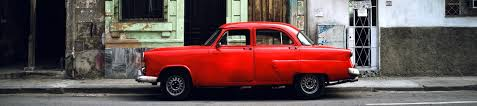

<a id=section101></a>
### 1.1 Background Information

This dataset contains **car sale advertisements** which was collected for study/practice purposes in **2016**. Though there is couple well known car features datasets they seems quite simple and outdated. Car topic is really interesting. This dataset contains data for more than **9.5K** cars sale in **Ukraine**. Most of them are used cars so it opens the possibility to analyze features related to car operation. At the end of the day I look at this data as a subset from all **Ukrainian** car fleet.

<a id=section102></a>
### 1.4 Plan of Action

In this notebook I would like to share some insights and interesting facts that I guess I have received while I was practising with the data.

<a id=section2></a>
### 2. Loading Libraries
Alright! lets begin our analysis by installing some packages and loading all the libraries.

In [ ]:
# Load libraries
    library(dplyr)
    library(vtree)
    library(ggplot2)
    library(psych)
    library(plotly)
    library(scales)

<a id=section3></a>
### 3. Data Loading and Dataset Description

| Records  | Features  |
| ------------ | ------------ |
| 9576  | 10 |

|  Column | Description  |
| ------------ | ------------ |
|  car | manufacturer brand  |
|  price | seller’s price in advertisement (in USD)  |
| body  | car body type  |
|  mileage |  as mentioned in advertisement (‘000 Km) |
|  engV |rounded engine volume (‘000 cubic cm)   |
|  engType | type of fuel (“Other” in this case should be treated as NA)  |
| registration  |  whether car registered in Ukraine or not |
|  year | year of production  |
|  model |  specific model name |
| drive  | drive type  |

<a id=section301></a>
### 3.1 Data Loading
Lets import our data first.

In [2]:
dataset <-read.csv("https://raw.githubusercontent.com/insaid2018/R/master/Projects/car_sales.csv",na.strings = c("NA",""))
head(dataset)

car,price,body,mileage,engV,engType,registration,year,model,drive
Ford,15500,crossover,68,2.5,Gas,yes,2010,Kuga,full
Mercedes-Benz,20500,sedan,173,1.8,Gas,yes,2011,E-Class,rear
Mercedes-Benz,35000,other,135,5.5,Petrol,yes,2008,CL 550,rear
Mercedes-Benz,17800,van,162,1.8,Diesel,yes,2012,B 180,front
Mercedes-Benz,33000,vagon,91,NA,Other,yes,2013,E-Class,NA
Nissan,16600,crossover,83,2.0,Petrol,yes,2013,X-Trail,full


<a id=section302></a>
### 3.2 Dataset Information

In [10]:
str(dataset)

'data.frame':	9576 obs. of  10 variables:
 $ car         : Factor w/ 87 levels "Acura","Alfa Romeo",..: 28 53 53 53 53 60 35 65 53 53 ...
 $ price       : num  15500 20500 35000 17800 33000 16600 6500 10500 21500 22700 ...
 $ body        : Factor w/ 6 levels "crossover","hatch",..: 1 4 3 6 5 1 4 5 4 4 ...
 $ mileage     : int  68 173 135 162 91 83 199 185 146 125 ...
 $ engV        : num  2.5 1.8 5.5 1.8 NA 2 2 1.5 1.8 2.2 ...
 $ engType     : Factor w/ 4 levels "Diesel","Gas",..: 2 2 4 1 3 4 4 1 2 1 ...
 $ registration: Factor w/ 2 levels "no","yes": 2 2 2 2 2 2 2 2 2 2 ...
 $ year        : int  2010 2011 2008 2012 2013 2013 2003 2011 2012 2010 ...
 $ model       : Factor w/ 888 levels "1 Series","1.3",..: 504 337 273 213 337 861 182 559 337 337 ...
 $ drive       : Factor w/ 4 levels "","front","full",..: 3 4 4 2 1 3 2 2 4 4 ...


**Observations:**

- There are a total of 9576 rows in the data.

- The dataset contains 10 columns.

- There are 6 Factors, and 4 numeric columns.

<a id=section303></a>
### 3.3 Dataset Description

 - Using the describe() function, we can compute descriptive statistics for numerical data. The descriptive statistics help determine the distribution of numerical variables.

In [11]:
describe(dataset)

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
car*,1,9576,51.092001,2.562769e+01,53.0,52.648003,34.0998,1.0,87.00,86.00,-0.42374129,-1.038028,2.618891e-01
price,2,9576,15633.317316,2.410652e+04,9200.0,10981.415733,7709.5200,0.0,547800.00,547800.00,7.12932064,93.673858,2.463443e+02
body*,3,9576,3.297306,1.604711e+00,4.0,3.246672,1.4826,1.0,6.00,5.00,-0.05818101,-1.045510,1.639853e-02
mileage,4,9576,138.862364,9.862975e+01,128.0,131.204255,91.9212,0.0,999.00,999.00,1.29783417,5.146457,1.007896e+00
engV,5,9142,2.646344,5.927699e+00,2.0,2.095163,0.7413,0.1,99.99,99.89,15.17722078,239.607131,6.199627e-02
engType*,6,9576,2.648183,1.331197e+00,3.0,2.685200,1.4826,1.0,4.00,3.00,-0.13817738,-1.763991,1.360349e-02
registration*,7,9576,1.941416,2.348566e-01,2.0,2.000000,0.0000,1.0,2.00,1.00,-3.75863294,12.128588,2.399997e-03
year,8,9576,2006.605994,7.067924e+00,2008.0,2007.516706,5.9304,1953.0,2016.00,63.00,-1.54976843,3.865421,7.222704e-02
model*,9,9576,455.447055,2.554205e+02,486.5,456.623858,328.3959,1.0,888.00,887.00,-0.03112623,-1.182794,2.610139e+00
drive*,10,9576,2.495301,8.027231e-01,2.0,2.435918,0.0000,1.0,4.00,3.00,0.53980431,-0.462796,8.203018e-03


**Observations:**

- Mean price of the car is 15633 , median is 9200 and max price of the car is 547800. So seems like price is positively skewed.

- Average miles of car is 138.

- We have cars data ranging from 1953 to 2016.

<a id=section304></a>
### 3.4 Data Cleaning
 - Now, lets do some data cleaning. For that, first we need to figure out the number of missing values in each column.

In [107]:
sapply(dataset,function(x){sum(is.na(x))})

car        price         body      mileage         engV      engType 
           0            0            0            0          434            0 
registration         year        model        drive 
           0            0            0          511

**Observations:**

- It appears that column **engV** has 434 number of missing values.
- **drive** variable has 511 missing values.

<a id=section305></a>
### 3.4.1 Null Values Treatement

 - We will replace **engV** NA values with the mean of the column.

In [3]:
dataset <- dataset %>% mutate(engV = if_else(is.na(engV), mean(engV, na.rm=TRUE), engV))

In [4]:
dataset$engV <- round(dataset$engV,1) # rounding the values to 1 digit

In [5]:
head(dataset)

car,price,body,mileage,engV,engType,registration,year,model,drive
Ford,15500,crossover,68,2.5,Gas,yes,2010,Kuga,full
Mercedes-Benz,20500,sedan,173,1.8,Gas,yes,2011,E-Class,rear
Mercedes-Benz,35000,other,135,5.5,Petrol,yes,2008,CL 550,rear
Mercedes-Benz,17800,van,162,1.8,Diesel,yes,2012,B 180,front
Mercedes-Benz,33000,vagon,91,2.6,Other,yes,2013,E-Class,NA
Nissan,16600,crossover,83,2.0,Petrol,yes,2013,X-Trail,full


 - We will replace **drive** NA values with the mode of the column.

In [111]:
dataset %>% group_by(drive) %>% summarize(count=n())

Warning message:
"Factor `drive` contains implicit NA, consider using `forcats::fct_explicit_na`"

drive,count
front,5188
full,2500
rear,1377
NA,511


 - We can see that front is appearing most number of times hence we will replace the NA with front wheel drive.

In [6]:
dataset$drive[is.na(dataset$drive)] <- "front"

In [7]:
head(dataset)

car,price,body,mileage,engV,engType,registration,year,model,drive
Ford,15500,crossover,68,2.5,Gas,yes,2010,Kuga,full
Mercedes-Benz,20500,sedan,173,1.8,Gas,yes,2011,E-Class,rear
Mercedes-Benz,35000,other,135,5.5,Petrol,yes,2008,CL 550,rear
Mercedes-Benz,17800,van,162,1.8,Diesel,yes,2012,B 180,front
Mercedes-Benz,33000,vagon,91,2.6,Other,yes,2013,E-Class,front
Nissan,16600,crossover,83,2.0,Petrol,yes,2013,X-Trail,full


***We will check our dataset to see if there are any NA values.***

In [8]:
sapply(dataset, function(x){sum(is.na(x))})

car        price         body      mileage         engV      engType 
           0            0            0            0            0            0 
registration         year        model        drive 
           0            0            0            0

 - We can see that all the NA values have been replced.

<a id=section306></a>
### 3.4.2 Zero Data Identification & Handling

- We have **price** variable with min values as 0, We need to remove these rows as they will not add any value in our analysis.

In [115]:
head(filter(dataset,price==0))

car,price,body,mileage,engV,engType,registration,year,model,drive
Land Rover,0,crossover,0,4.4,Diesel,yes,2016,Range Rover,full
Mercedes-Benz,0,crossover,0,3.0,Diesel,yes,2016,GLE-Class,full
Mercedes-Benz,0,crossover,0,3.0,Diesel,yes,2016,GLE-Class,full
Toyota,0,crossover,0,4.5,Diesel,yes,2016,Land Cruiser 200,full
Porsche,0,sedan,22,4.8,Petrol,yes,2014,Panamera,full
Audi,0,crossover,0,3.0,Diesel,yes,2015,Q7,full


- We have 267 rows for price with zero values, hence we will remove these rows.

In [9]:
dataset<-dataset[!(dataset$price==0),]

In [10]:
head(filter(dataset,price==0))

car,price,body,mileage,engV,engType,registration,year,model,drive


 - We have removed all the values in price which were populating as zero.

In [11]:
target <- c(3.00E+05,1.00E+05,2.00E+05)

In [12]:
d <- filter(dataset,price %in% target)
d

car,price,body,mileage,engV,engType,registration,year,model,drive
Mercedes-Benz,2e+05,van,19,3.5,Petrol,yes,2013,Sprinter 324 ïàññ.,rear
Toyota,1e+05,crossover,0,4.5,Diesel,yes,2016,Land Cruiser 200,full
Mercedes-Benz,3e+05,sedan,68,6.0,Petrol,yes,2011,S 600,front
Mercedes-Benz,3e+05,other,37,5.0,Petrol,yes,2012,G 500,full


 - As we can see there are scientic notation populating for price which we will remove.

In [13]:
 dataset<-dataset[!(dataset$price %in% target),]

In [14]:
d <- filter(dataset,price %in% target)
d

car,price,body,mileage,engV,engType,registration,year,model,drive


In [15]:
dataset$price <- round(dataset$price) # rounding the price variable

<a id=section4></a>
### 4. Exploratory Data Analysis

<a id=section401></a>
#### 4.1 Univariate Analysis

**<h4>Question 1: What are the top selling cars?</h4>**

In [105]:
length(unique(dataset$car))

[1] 86

 - As there are 86 unique cars in our dataset, we will only see Top 10 selling cars.

In [16]:
top_10_cars <- dataset %>% group_by(car) %>% summarize(count=n()) %>% arrange(desc(count))

In [17]:
top_cars <- top_10_cars[1:10,]

In [18]:
top_cars

car,count
Volkswagen,908
Mercedes-Benz,849
BMW,669
Toyota,522
VAZ,480
Renault,456
Audi,442
Opel,395
Nissan,366
Skoda,363


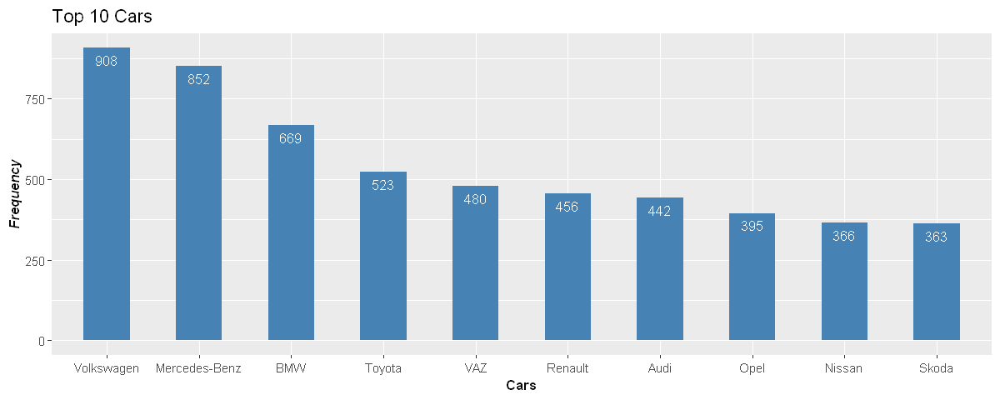

In [167]:
ggplot(top_cars,aes(x=reorder(car, -count),y=count))+geom_bar(stat="identity",fill="steelblue",width = 0.5) + 
    geom_text(aes(label=count), vjust=1.6, color="white", size=3.5) +
ggtitle("Top 10 Cars")+labs(x = "Cars", y = "Frequency")+
  theme(
    axis.title.x = element_text(size = 10, face = "bold"),
    axis.title.y = element_text(size = 10, face = "bold.italic")
  )

In [151]:
d <- dataset %>%
    group_by(car) %>%
    summarise(minyear=min(year)) %>%
    arrange(minyear) %>%
    as.data.frame()

filter(d,car %in% c("Volkswagen","Mercedes-Benz","BMW"))

car,minyear
Mercedes-Benz,1969
Volkswagen,1980
BMW,1983


**Observations:** 

- ***Volkswagen*** sold more cars followed by ***Mercedes-Benz*** and ***BMW***.
- But ***Volkswagen*** started selling car in ***Ukraine*** from 1980 where ***Mercedes-Benz*** was selling from 1969.
- Could be ***Mercedes-Benz*** usually sell luxurious cars and hence few people preferred ***Volkswagen***.

**<h4>Question 2: What are the Preferred Body Type?</h4>**

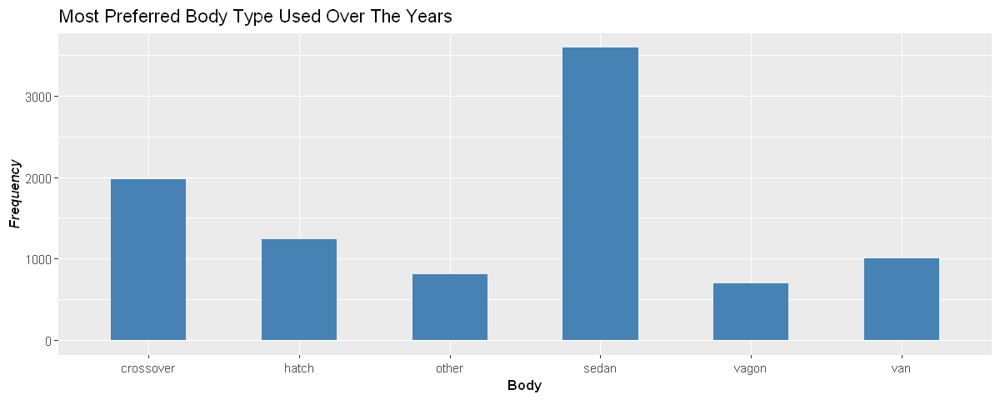

In [184]:
ggplot(dataset,aes(x=body))+geom_bar(fill="steelblue",width = 0.5) +
ggtitle("Most Preferred Body Type Used Over The Years")+labs(x = "Body", y = "Frequency")+
  theme(
    axis.title.x = element_text(size = 10, face = "bold"),
    axis.title.y = element_text(size = 10, face = "bold.italic")
  )

**Observations:**

- This shows people prefer **Sedan** type of body mostly may be because Sedans are reasonably priced, and get decent ***gas mileage*** (cost is important for people on a fixed income).


**<h4>Question 3: What are the Most preferred Engine Type?</h4>**

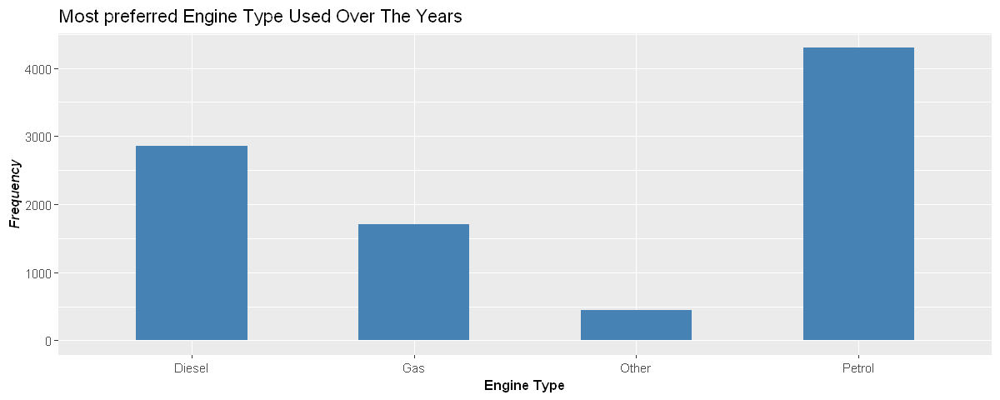

In [185]:
ggplot(dataset,aes(x=engType))+geom_bar(fill="steelblue",width = 0.5) +
ggtitle("Most preferred Engine Type Used Over The Years")+labs(x = "Engine Type", y = "Frequency")+
  theme(
    axis.title.x = element_text(size = 10, face = "bold"),
    axis.title.y = element_text(size = 10, face = "bold.italic")
  )


**Observations:**

- As we can see, we have more **Petrol** driven vechile.
- Diesel engines are more expensive to build and maintain, hence small cars where buyers are most price sensitive, tend to be buying Petrol cars.

**<h4>Question 4: Car sales over the years</h4>**

In [19]:
year_cars <- dataset %>% group_by(year) %>% summarize(count=n()) %>% arrange(desc(count))

In [20]:
ggplotly(ggplot(year_cars,aes(x=year,y=count))+
    geom_line(alpha=0.5))

HTML widgets cannot be represented in plain text (need html)

**Observations:**

- As we can see, we have data ranging from **1953 - 2016**.
- After the dissolution of the **Soviet Union in 1991**, there has been a clear spike in car sales.
- After 2008 there has been a sharp decline in car sales due to the **automotive industry crisis** from the year 2008 to 2010.
- Highest sale was made in the year **2008** which was **1142** followed by **2012** (This info can be use to start working/research why sale was max in this year).


**<h4>Question 5: What are the Most preferred Drive Type?</h4>**

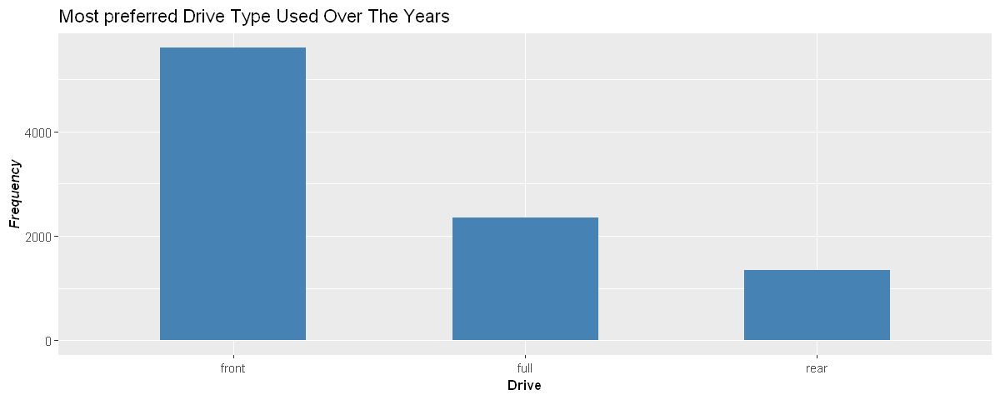

In [220]:
ggplot(dataset,aes(x=drive))+geom_bar(fill="steelblue",width = 0.5) +
ggtitle("Most preferred Drive Type Used Over The Years")+labs(x = "Drive", y = "Frequency")+
  theme(
    axis.title.x = element_text(size = 10, face = "bold"),
    axis.title.y = element_text(size = 10, face = "bold.italic")
  )

 - Fron Wheel Drive cars are more efficient than Rear Wheel Drive both in terms of space utilization and fuel economy, and that is why they have dominated the car market. 
 
- They are also somewhat cheaper to build, but their better traction and control on snow and ice is why they are prefrred more in Ukraine.

<a id=section402></a>
#### 4.2 Bivariate Analysis

**<h4>Question 1: How car price has varied over the years?</h4>**

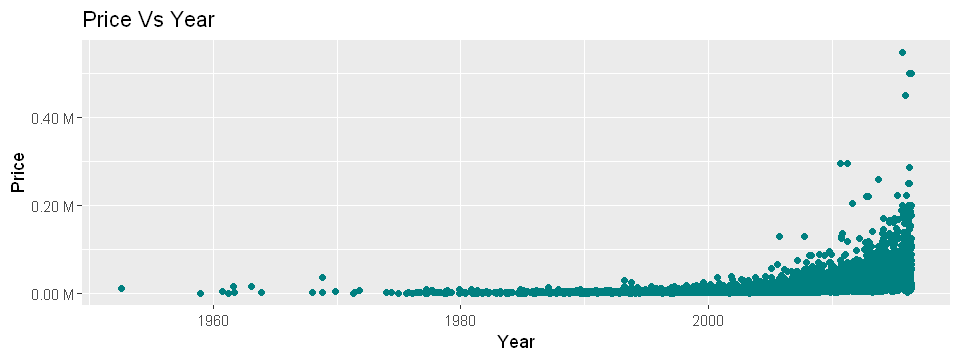

In [197]:
ggplot(dataset,aes(x=year,y=price))+geom_jitter(color='#008080',fill='grey')+
  ggtitle("Price Vs Year")+xlab("Year")+ylab("Price") +
     expand_limits( y = c(0, NA)) +
  scale_y_continuous(labels = unit_format(unit = "M", scale = 1e-6))

 - With the Scatter Plot, we visualize the correlations between values.

For example, above chart we see the collation between year and price. We cannot comment on the price increasing as the years increase, but in general, an increase in the price has been observed in recent years.

**<h4>Question 2: Highest priced cars sold over the years</h4>**

In [21]:
car_price <- dataset %>% select(car,price) %>% group_by(car) %>% summarise(Total = sum(price)) %>% arrange(desc(Total))
top_car_price <- car_price[1:10,]

In [22]:
top_car_price

car,Total
Mercedes-Benz,25278057
BMW,15738471
Volkswagen,11917744
Toyota,11715207
Audi,8172417
Land Rover,7634175
Nissan,5192312
Lexus,4827315
Hyundai,4571831
Porsche,4195824


In [23]:
options(repr.plot.width=8, repr.plot.height=3)
ggplotly(ggplot(top_car_price,aes(x=reorder(car, -Total),y=Total))+geom_bar(stat="identity",fill="#AA4371",width = 0.5) + 
    ggtitle("Top 10 Cars Vs Price")+labs(x = "Cars", y = "Total Price")+
    expand_limits(x = c(0, NA), y = c(0, NA)) +
  scale_y_continuous(labels = unit_format(unit = "M", scale = 1e-6))+
        theme(
    axis.title.x = element_text(size = 10, face = "bold"),
    axis.title.y = element_text(size = 10, face = "bold.italic")
  ))

HTML widgets cannot be represented in plain text (need html)

##### Ukrainians are not interested in VAZ, but Mercedes-Benz is popular.
##### The President of Ukraine uses an armoured Mercedes-Benz S-Class and an armoured Volkswagen Phaeton Model 2011 in a V12 long version

**<h4>Question 3: Registration of the cars over the years</h4>**

In [219]:
reg <- dataset %>% group_by(year,registration) %>% summarise(count=n()) %>% arrange(desc(count))

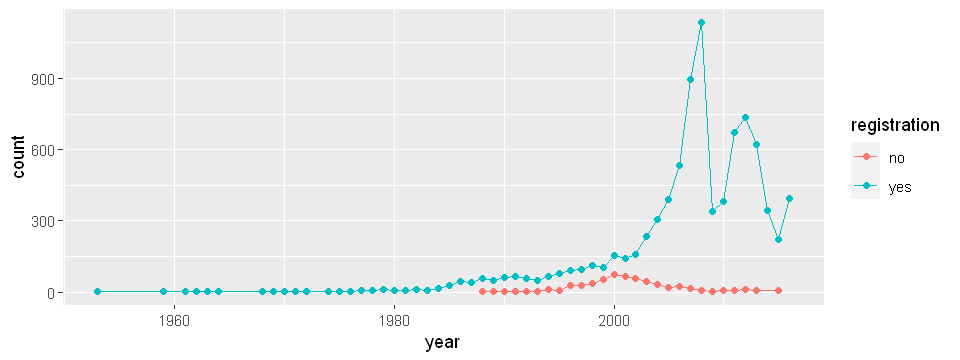

In [222]:
p = ggplot(reg, aes(x = year, y = count, color = registration)) 
p+geom_point()+geom_line()

**Observations:**
- There was highest registration done in the year 2008, We have seen in our earlier graph as well.
- But suprising is we have many cars without registrations, what does this mean? Could be these are foriegn license plate numbers and not registered in Ukraine.

In [235]:
reg_no <- dataset %>% filter(registration=="no") %>% summarise(count=n()) %>% arrange(desc(count))

In [233]:
reg_no

count
554


 - We have total of **554** cars with registration as "no" in our dataset out of 9576.

 - *Let's look at the Top 3 brands without registration which will give us idea about manufacturing country of this car*.

In [236]:
reg_count <- dataset %>% group_by(car) %>% filter(registration=="no") %>% summarise(count=n()) %>% arrange(desc(count))

In [237]:
reg_count[1:3,]

car,count
BMW,109
Audi,103
Volkswagen,72


 - As we can these 3 car manufacturer are from **Germany** and may be people of **Ukraine** are found of German cars.

<a id=section403></a>
#### 4.3 Feature Engineering

- We have very high varying values in price hence, we will divide the price value with 1000.
- We will create a new variable from the year called Age.
- We will also create a net annual mileage from the age of the car.

In [24]:
df <- dataset %>% 
      mutate(price = price/1000, # price in '000
             age = as.numeric(format(Sys.Date(), "%Y")) - year, # age
             annualRun = mileage/age) %>% 
      filter(age != 0) # remove new cars

In [25]:
head(df,2)

car,price,body,mileage,engV,engType,registration,year,model,drive,age,annualRun
Ford,15.5,crossover,68,2.5,Gas,yes,2010,Kuga,full,10,6.80000
Mercedes-Benz,20.5,sedan,173,1.8,Gas,yes,2011,E-Class,rear,9,19.22222


In [26]:
TopByProd <- df %>% 
      group_by(car) %>% 
      summarise(carNum = n(), medianRun = round(median(annualRun), 1), meanage = round(mean(age), 1)) %>% 
      arrange(desc(carNum)) %>% 
      as.data.frame()
head(TopByProd, 10)

car,carNum,medianRun,meanage
Volkswagen,908,12.8,13.4
Mercedes-Benz,849,12.5,14.1
BMW,669,11.7,15.0
Toyota,522,10.0,11.7
VAZ,480,6.9,19.5
Renault,456,13.9,11.8
Audi,442,12.1,15.3
Opel,395,12.1,17.5
Nissan,366,8.1,11.7
Skoda,363,11.2,11.1


 - It seems that ***VAZ (Soviet/Russian car manufacturer)*** has much lower annual mileage than other popular producers. On the other hand it has the biggest age in average. It is obvious that annual mileage falls while car is getting older. But let’s check.

In [27]:
runByAge <- df %>%  
      group_by(age) %>% 
      summarise(carNum = n(), medianRun = median(annualRun), meanRun = mean(annualRun))

In [28]:
options(repr.plot.width=5, repr.plot.height=4)
ggplotly(ggplot(runByAge, aes(x = age, y = medianRun)) + geom_line(colour = "#66CC99") + 
      geom_point(colour = "#66CC99", size = 2) + 
      scale_x_continuous(breaks=seq(0, 50, 5), limits= c(0, 50)) +
      ggtitle("Median mileage depending on car age"))

HTML widgets cannot be represented in plain text (need html)

 - A rule is quite obvious. There is a wide “plateau” for 7-18 years old cars at the level of 12’000 km per year. Than the level goes down. Let’s check the mileage variance for age groups.

In [29]:
df <- mutate(df, ageGroup = ifelse(age<= 3, "a(<=3)", 
                                   ifelse(3 < age & age <= 6, "b(4-6)",
                                          ifelse(5 < age & age <= 10, "c(7-10)",
                                                 ifelse(10 < age & age <= 15, "d(11-15)",
                                                        ifelse(15 < age & age <= 20, "e(16-20)",
                                                               ifelse(20 < age & age <= 30, "f(21-30)",
                                                                      "g(30+)")))))))

In [30]:
df$ageGroup <- as.factor(df$ageGroup)
df <- arrange(df, ageGroup)
table(df$ageGroup)


  b(4-6)  c(7-10) d(11-15) e(16-20) f(21-30)   g(30+) 
     962     2449     3361     1267      951      315 

Warning message:
"Removed 12 rows containing non-finite values (stat_boxplot)."

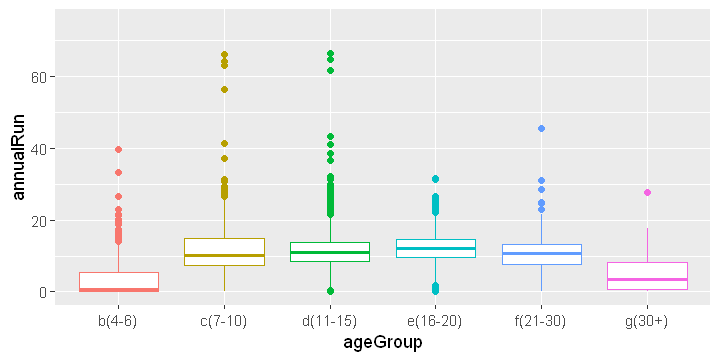

In [71]:
options(repr.plot.width=6, repr.plot.height=3)
ggplot(df,aes(x= ageGroup, y= annualRun,color = ageGroup)) +
geom_boxplot() + ylim(0, 75) + theme(legend.position = "none")

 - As we see average values of mileage for VAZ are lower than 2nd qurtile for all cars of this age. I know that in this cars it is easy to “adjust” speedometer readings. And I assumed that we got evidence of such massive manipulations.

**And what is the picture of year of production?**

In [31]:
ageDistr <- df %>% 
      group_by(age, year) %>% 
      summarise(carNum = n()) %>% 
      arrange(age) %>% 
      as.data.frame()

In [32]:
ggplotly(ageDistr %>% 
      filter(year > 1960) %>% 
      ggplot(aes(x = year, y = carNum)) + geom_line() + geom_point() +
      geom_area(fill = "blue", alpha = .2) + scale_x_continuous(breaks=seq(1960, 2015, 5)))

HTML widgets cannot be represented in plain text (need html)

- There are two clear groups. The first one is relevant to post **Soviet period** growth with a burst after 2000. The second one is short recovery after 2008 crisis.

- **It is interesting to see what are the oldest cars at the market.**

In [79]:
oldest <- df %>%
    group_by(car,model) %>%
    summarise(carNum = n(), AVyear = round(mean(year), 0)) %>%
    arrange(AVyear) %>%
    as.data.frame()
head(oldest,10)

car,model,carNum,AVyear
Moskvich-AZLK,401,1,1953
ZAZ,965,1,1961
GAZ,21,8,1964
Moskvich-AZLK,403,1,1964
Moskvich-AZLK,412,1,1971
Mercedes-Benz,S 280,2,1974
Ford,Granada,2,1978
UAZ,452 ïàññ.,1,1978
Opel,Manta,1,1979
GAZ,24,3,1981


 - Mainly it is **Soviet classics** but at the same time you can buy stylish coupe **Opel Manta** from 1979!

 - Below are the pics of the top 3 **Soviet classics** cars in our list

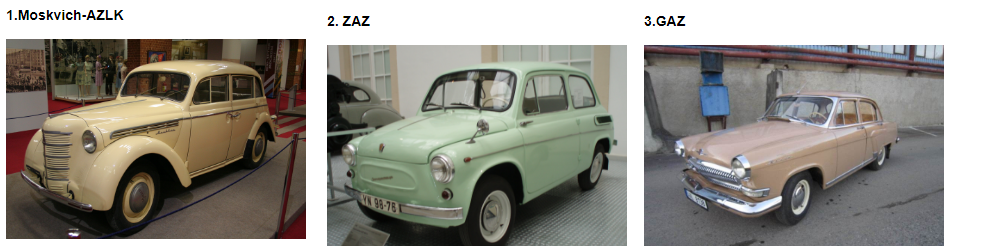

**Opel Manta**

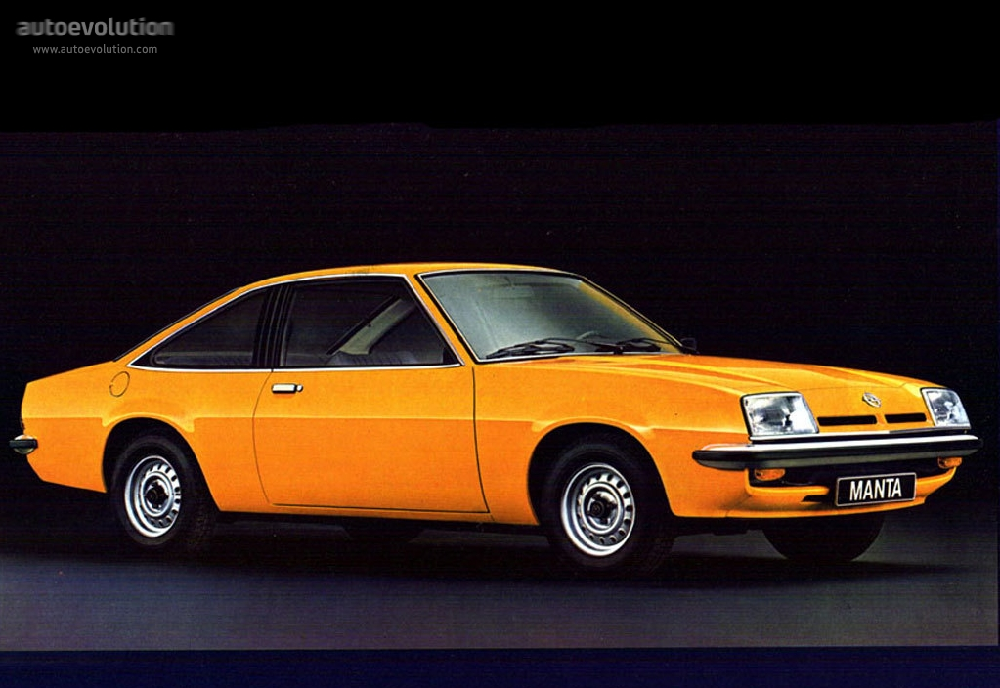

**What about petrol and body type? Do they influence drivers mileage?**

In [83]:
RunByEngine <- df[which(df$body != "van"),] %>% 
      group_by(engType) %>% 
      summarise(carNum = n(), medianRun = round(median(annualRun), 1), 
                meanRun = round(mean(annualRun), 1), avAge = round(mean(age), 1)) %>% 
      arrange(desc(carNum)) %>% 
      as.data.frame()
RunByEngine

engType,carNum,medianRun,meanRun,avAge
Petrol,4229,8.8,8.7,13.5
Diesel,1995,12.4,11.9,12.1
Gas,1652,10.7,10.8,15.6
Other,423,7.5,8.1,12.9


- We have excluded vans because they are mainly diesels and are often used as commercial transport. Anyway we see Diesel engines have consistently bigger annual mileage. Though they are some younger than other types. Let’s check distributions.

Warning message:
"Removed 12 rows containing non-finite values (stat_boxplot)."

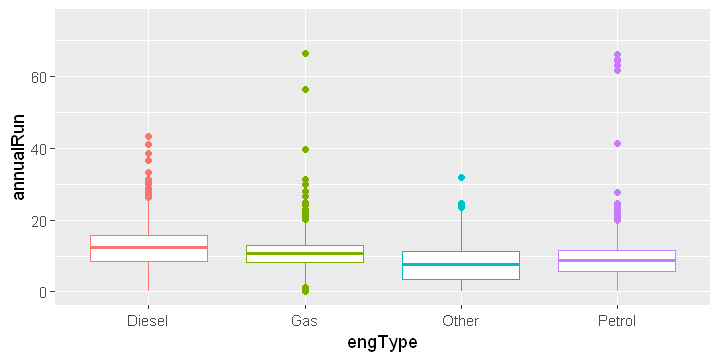

In [84]:
ggplot(df[which(df$body != "van"),], aes(x = engType, y = annualRun, color = engType)) +
      geom_boxplot() + ylim(0, 75) + theme(legend.position = "none")

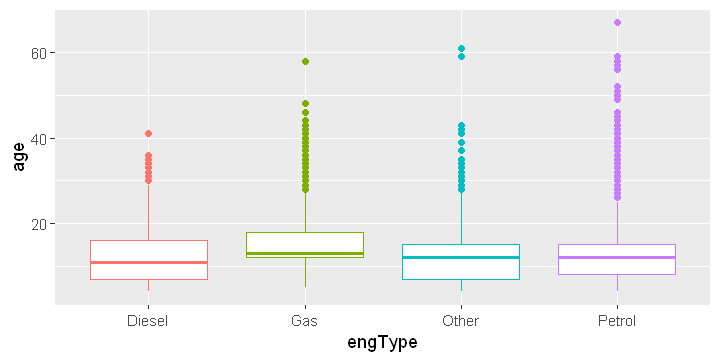

In [85]:
ggplot(df[which(df$body != "van"),], aes(x = engType, y = age, color = engType)) +
      geom_boxplot() + theme(legend.position = "none")

 - It looks like Diesel drivers are indeed tend to drive more. Also we can see that the cars which use gas as a fuel are mainly old ones. And it is clear because often people install gas equipment at old voracious petrol cars.

**Now let’s look at engine volume.**

Warning message:
"Removed 96 rows containing non-finite values (stat_bin)."Warning message:
"Removed 2 rows containing missing values (geom_bar)."

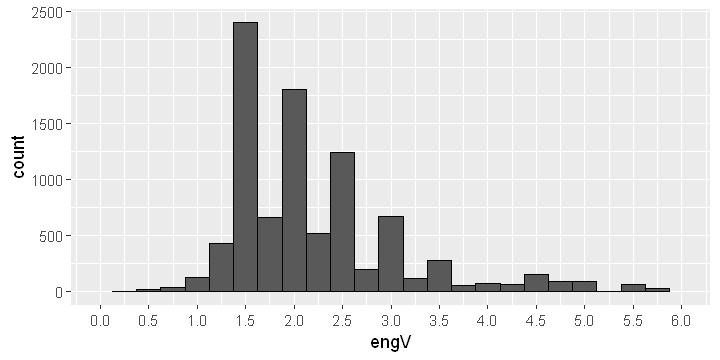

In [93]:
df %>% ggplot(aes(x=engV))+geom_histogram(binwidth=.25, colour="black") +
scale_x_continuous(breaks = seq(0,6,0.5),limits = c(0,6))

- The most popular one is 1.5-1.6 & 2litres engine. Does the pattern differ across different engine types? Let’s see.

Warning message:
"Removed 89 rows containing non-finite values (stat_bin)."Warning message:
"Removed 6 rows containing missing values (geom_bar)."

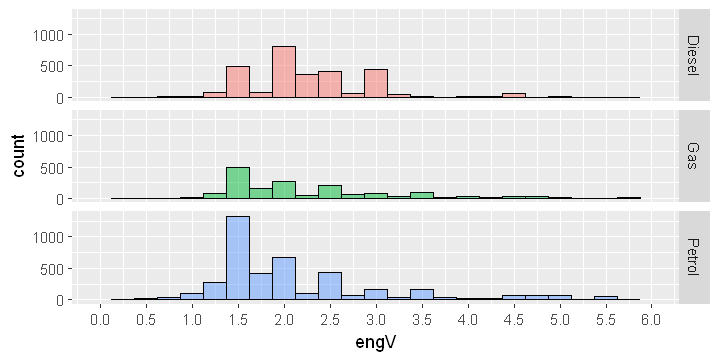

In [98]:
df %>%
    filter(engType != "Other") %>%
    ggplot(aes(x= engV,fill= engType)) +
    geom_histogram(binwidth = .25,alpha=.5, colour="black", position="identity") +
    scale_x_continuous(breaks = seq(0,6,0.5),limits = c(0,6)) +
    facet_grid(engType~.) + theme(legend.position = "none")

 - Indeed main part of diesel engines has 2l volume, while petrol as usual is just 1.5l. Gas engines have the same pattern as petrol because again they are just reworked petrol ones.

 - It is also interesting to take a look at body type and engine volume relation.

Warning message:
"Removed 121 rows containing non-finite values (stat_boxplot)."

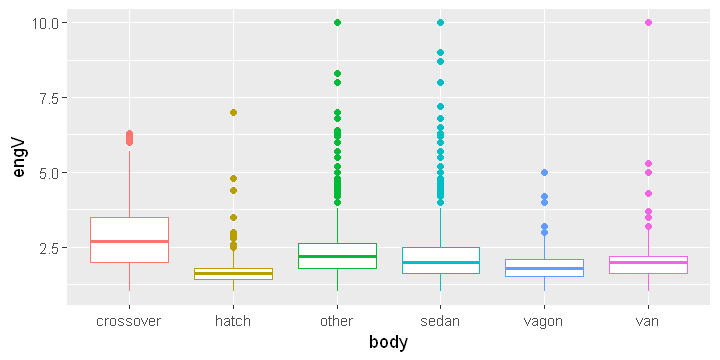

In [104]:
ggplot(df, aes(x = body, y = engV, color = body)) + geom_boxplot() + 
    scale_y_continuous(breaks=seq(0, 10, 2.5), limits= c(1, 10)) +        
      theme(legend.position = "none")

 - Hatchbacks almost don’t have variance - their engines gathered in 1.4-1.6 liters zone. Almost the same with wagons which often have 2l volume. While crossover engine volume can vary significantly.

<a id=section5></a>
### 5. Conclusion

- In this notebook, I've tried to cover basic initial steps of exploratory data analysis
	1. Identification of variables and data types
	2. Missing value treatment
	3. Outlier treatment
	4. Non-Graphical Univariate Analysis
	5. Graphical Univariate Analysis
	6. Bivariate Analysis
	7. Variable transformations
    

- Also I've made use of libraies like dplyr, ggplot2 and plotly to develop better insights about the data.
- We have seen impact of columns like mileage, year, body type and engType on the Price increase/decrease rate.
- It is clear from the anlysis that Ukraine people prefer German made cars.
- This analysis indicates that there is wide oppurtunites for other country car manfuturers to make their mark here like Hyundai.